In [1]:
from pathlib import Path
import torch
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

plt.rcParams["savefig.bbox"] = 'tight'
from torchvision.transforms import v2
from PIL import Image

orig_img = Image.open(Path('../data/1.jpg'))

/home/kaka/anaconda3/envs/plants-toxic-for-cats/lib/python3.11/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.15 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [15]:

def plot(transforms, img):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    
    for i in range(4):
        transformed_img = transforms(img)
        axs[i].imshow(transformed_img)
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show()

TypeError: Transform.forward() got an unexpected keyword argument 'image'

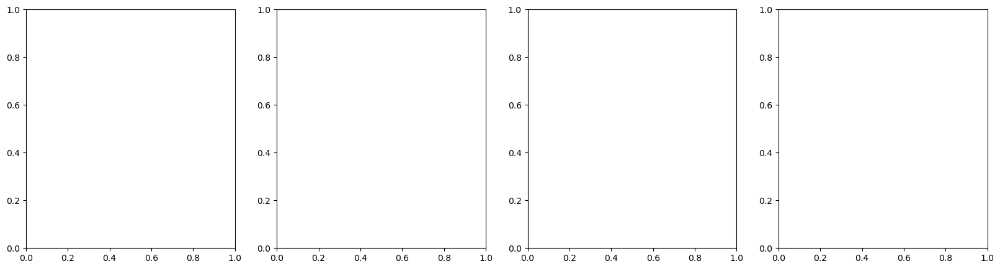

In [16]:
transform = v2.RandomResizedCrop(224, scale=(0.5, 1.0), ratio=(0.75, 1.333))
plot(transform, orig_img)

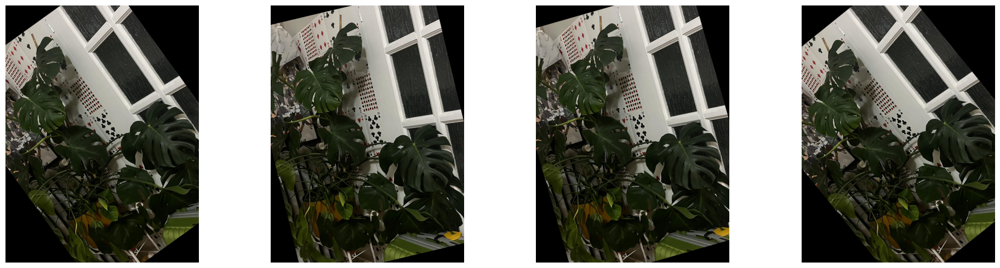

In [4]:
transform = v2.RandomRotation(degrees=45)
plot(transform, orig_img)

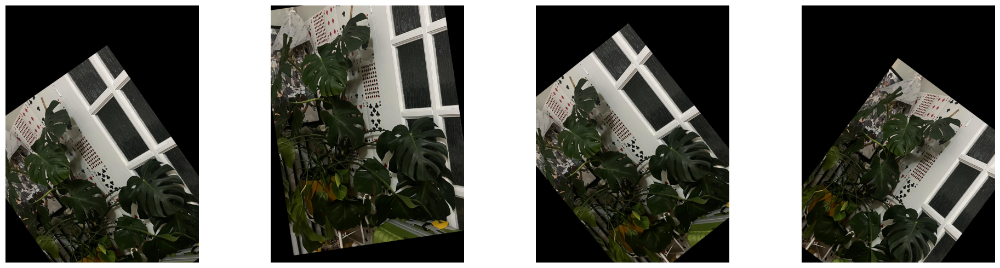

In [5]:
transform = v2.RandomAffine(degrees=(-40, 40), translate=(0.0, 0.5), scale=(0.8, 1))
plot(transform, orig_img)

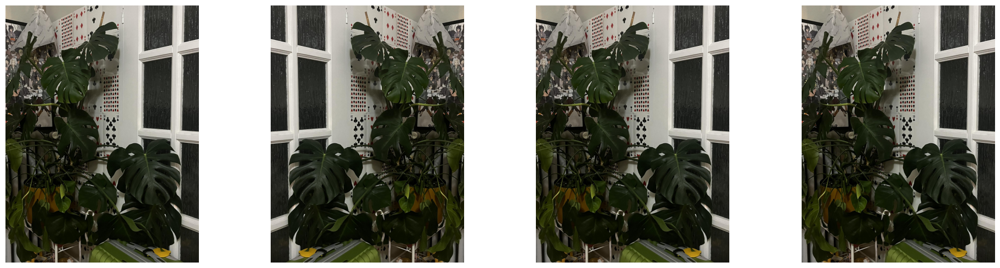

In [6]:
plot(v2.RandomHorizontalFlip(p=0.5), orig_img)

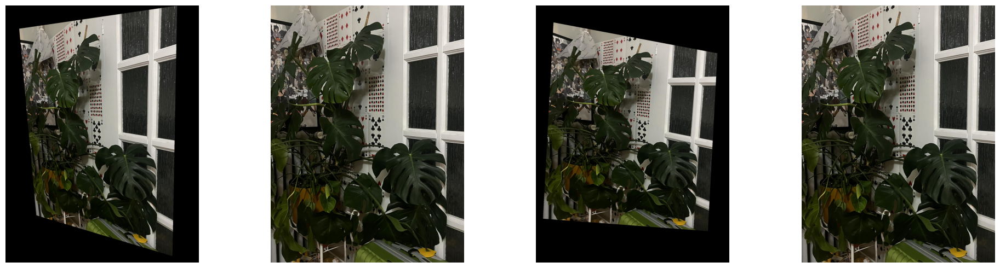

In [7]:
plot(v2.RandomPerspective(distortion_scale=0.4, p=0.75), orig_img)

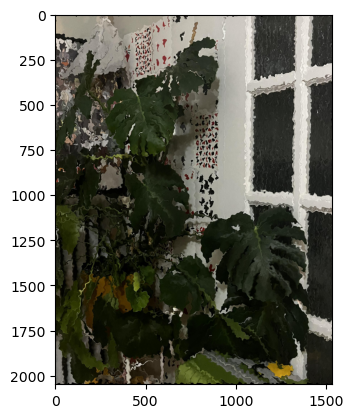

In [8]:
plt.imshow(v2.ElasticTransform(alpha=250)(orig_img))

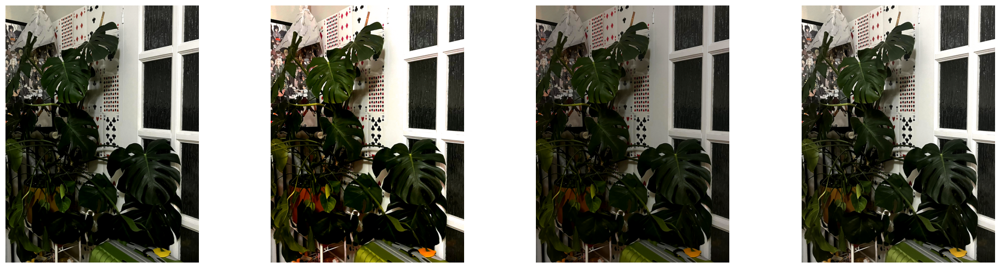

In [9]:
transform = v2.ColorJitter(brightness=0.3, contrast=0.5, saturation=0.4, hue=0.05)
plot(transform, orig_img)

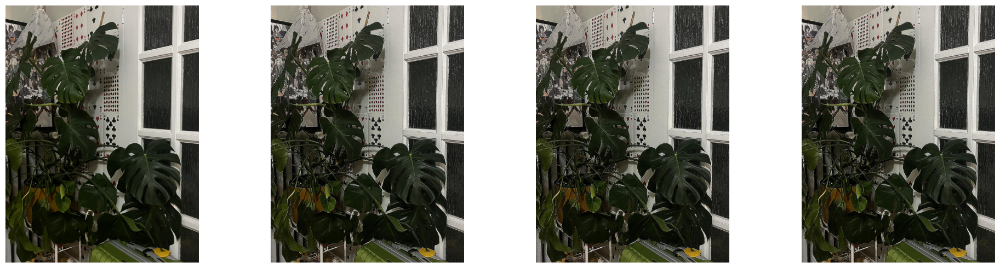

In [10]:
plot(v2.RandomAdjustSharpness(sharpness_factor=20, p=0.75), orig_img)

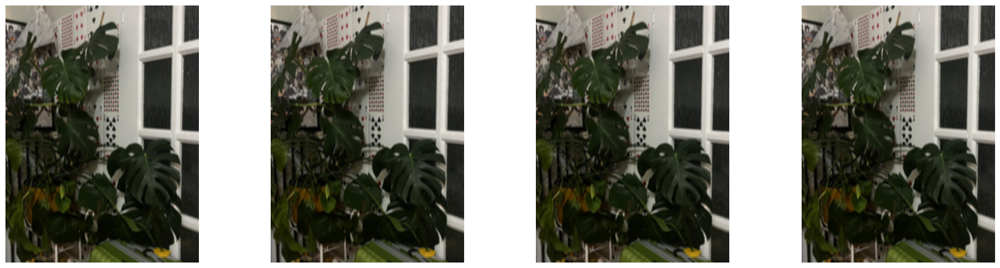

In [11]:
plot(v2.GaussianBlur(kernel_size=(11, 21), sigma=(45, 50)), orig_img)

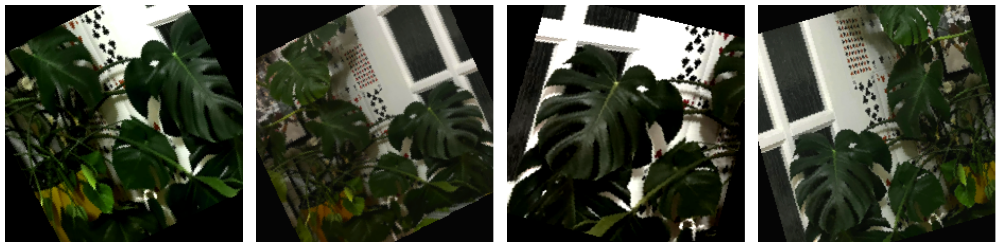

In [12]:
transforms = v2.Compose([
    v2.RandomResizedCrop(224),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomPerspective(distortion_scale=0.1, p=0.75), 
    v2.RandomRotation(degrees=40),
    v2.ColorJitter(brightness=0.3, contrast=0.5, saturation=0.4, hue=0.05),
])
plot(transforms, orig_img)

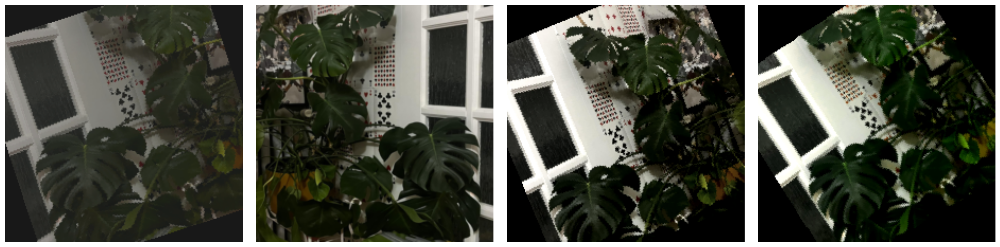

In [13]:
transforms = v2.Compose([
    v2.RandomResizedCrop(224, scale=(0.6, 1.0)),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomApply([
        v2.RandomPerspective(distortion_scale=0.1), 
        v2.RandomRotation(degrees=40),
        v2.ColorJitter(brightness=0.2, contrast=0.5, saturation=0.4, hue=0.05)
        ], p=0.7)
])
plot(transforms, orig_img)

In [24]:
import numpy as np

def plot_A(transforms, img):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    img = np.array(img)
    
    for i in range(4):
        transformed_img = transforms(image=img)['image']
        type(transformed_img)
        axs[i].imshow(transformed_img)
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show()

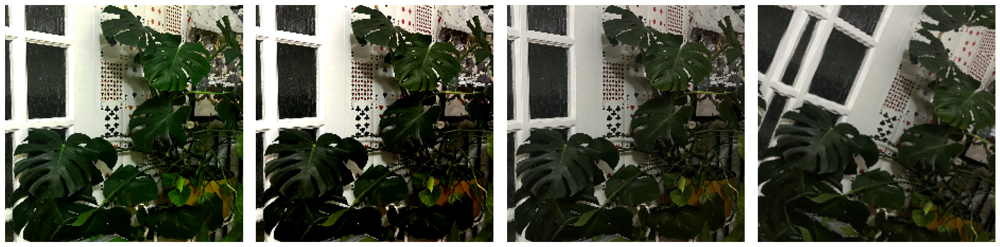

In [35]:
transforms = A.Compose([
    A.Resize(256, 256),
    A.CenterCrop(224, 224),
    A.HorizontalFlip(p=0.5),
    A.ColorJitter(brightness=0.3, contrast=0.4, saturation=0.4, hue=0.08, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=30, p=0.5),
])
plot_A(transforms, orig_img)